<img src="https://i.ibb.co/TcVMz44/logo.jpg" alt="logo" border="0" width=200>

# Computational Astrophysics 2021
---
## Eduard Larrañaga

Observatorio Astronómico Nacional\
Facultad de Ciencias\
Universidad Nacional de Colombia





## PDEs 03. Soilving the Linear Advection Equation

### About this notebook

In this notebook we present some of the techniques used to solve the linear advection equation.

`A. Garcia. Numerical Methods for Physics. (1999). Chapter 6 - 7 `

---

## The Linear Advection Equation

An example of the **first-order hyperbolic systems** in one spatial dimension is the **linear advection equation**, in which the function $u=u(t,x)$ satisfies

\begin{equation}
\partial_t u + v \partial_x u = 0\,\,,
\end{equation}

which is first order, linear, and homogeneous. An exact
solution of this equation is given by any function depending on the arguments

\begin{equation}
u(t,x) = u(t=0,x-vt)\,\,.
\end{equation}

Hence, the advection equation does (as one might expect) just translate
the given data along the x-axis with constant advection velocity $v$.


---

## Methods of Solution for the Advection Equation

### 1. FTCS Discretization

Using a **F**orward in **T**ime, **C**entered in **S**pace (FTCS) Discretization in the advection equation gives the relation

\begin{equation}
  u^{(n+1)}_j = u^{(n)}_j - \frac{v \Delta t}{2\Delta x} \left(u^{(n)}_{j+1} - u^{(n)}_{j-1}\right)\,\,.
\end{equation}

Note that the index $n$ refers to the time discretization while the index $j$ refers to the spatial discretization. In this method, the definion of the grid needs some kind of criteria to introduce the boundary conditions.

**Stability**

The stability of this method is analized by introducing the function $u(x,t^{n}) = u^{(n)} = e^{ikx}$ into the discretized  equation. This gives

\begin{equation}
\begin{aligned}
u^{(n+1)}_j &= e^{ik j\Delta x } - \frac{v \Delta t}{2\Delta x} \left(e^{ik (j+1)\Delta x } - e^{ik (j-1) \Delta x }\right)\,\,,\\
&= \left(1 - \frac{v\Delta t}{2 \Delta x} \left( e^{ik\Delta x} - e^{-ik\Delta x} \right) \right) e^{ik j \Delta x }\,\,,\\
&= \underbrace{\left( 1- \frac{v\Delta t}{\Delta x} i \sin(k\Delta x) \right)}_{{=\xi}} e^{ik\Delta x j}\,\,,
\end{aligned}
\end{equation}

where the coefficient satisfies 

\begin{equation}
|\xi| = \sqrt{\xi \xi^*} = \sqrt{1 + \left(\frac{v\Delta t}{\Delta x} \sin(k\Delta x)\right)^2} > 1\,\,.
\end{equation}

This result implies that the FTCS method is **unconditionally unstable** for the
advection equation!

---
###  2. Upwind Method

We consider now  a First-order in Space, First-order in
Time method to test if it could be stable.

The spatial
derivative, to first order, has two possiblities:

\begin{equation}
\begin{aligned}
\frac{\partial u}{\partial x} &\approx \frac{1}{\Delta x}(u_j - u_{j-1}) \hspace{1cm}\text{upwind finite difference,}\\
\frac{\partial u}{\partial x} &\approx \frac{1}{\Delta x}(u_{j+1} - u_{j})
\hspace{1cm}\text{downwind finite difference.}
\end{aligned}
\end{equation}

These are both so-called one-sided approximations, because they use
data only from one side or the other of point $x_j$. 

Coupling one
of these equations with forward Euler integration in time yields

\begin{equation}
\begin{aligned}
u_j^{(n+1)} &= u_j^{(n)} - \frac{v\Delta t}{\Delta x} \left(u_j^{(n)} - u_{j-1}^{(n)}\right) \hspace{1cm}\text{upwind,}\\
u_j^{(n+1)} &= u_j^{(n)} - \frac{v\Delta t}{\Delta x} \left(u_{j+1}^{(n)} - u_{j}^{(n)}\right) \hspace{1cm}\text{downwind}\,\,.
\end{aligned}
\end{equation}


**Stability**

Stability analysis shows that the upwind method is stable for

\begin{equation}
0 \le \frac{v \Delta t}{\Delta x} \le 1\,\,,
\end{equation}

while the downwind method is stable for

\begin{equation}
-1 \le \frac{v \Delta t}{\Delta x} \le 0\,\,,
\end{equation}

which just confirms that for $v > 0$ one should use the upwind
method and for $v < 0$ the downwind method.

The condition

\begin{equation}
\alpha = \left|\frac{v\Delta t}{\Delta x}\right| \le 1\,\,
\label{eq:pde_courant1}
\end{equation}

is a mathematical realization of the
physical causality principle: the propagation of information
(via advection) in one time step $\Delta t$ must not jump
ahead more than one grid interval of size $\Delta x$.

The demand that $\alpha \le 1$ is usually referred to as the 
**Courant-Friedrics-Lewy (CFL) condition**. The
CFL condition is used to determine the allowable time
step given a spatial grid size $\Delta x$ and for a certain accuracy and
stability, 

\begin{equation}
\Delta t = c_\mathrm{CFL} \frac{\Delta x}{|v|}\,\,,
\end{equation}

where $c_\mathrm{CFL} \le 1$ is the CFL factor.

---
### 3. Lax-Friedrich Method

The Lax-Friedrichs method, like FTCS, is first order in time, but
second order in space. It is given by

\begin{equation}
u_{j}^{(n+1)} = \frac{1}{2}\left(u^{(n)}_{j+1} + u^{(n)}_{j-1}\right) - 
\frac{v \Delta t}{2\Delta x} \left(u^{(n)}_{j+1} - u^{(n)}_{j-1}\right)\,\,,
\end{equation}

and, compared to FTCS, has been made stable for $\alpha \le 1$ by using the average of the old result at
points $j+1$ and $j-1$ to compute the update at point $j$. This is
equivalent to adding a dissipative term to the equations (which damps
the instability of the FTCS method) and leads to rather poor accuracy.

dx = 0.1001001001001001
C_{CFL} = 0.2
dt = 0.2002002002002002


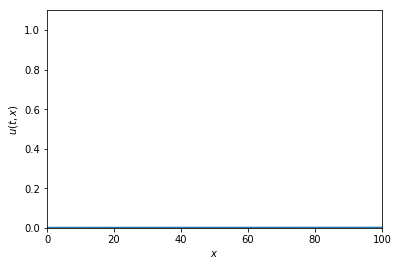

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
%matplotlib inline

# Definition of the initial Gaussian profile
def Psi(x):
    x0 = 30. 
    sigma = np.sqrt(15.)
    return np.exp(-(x-x0)**2/(2*sigma**2))

# Velocity of the advection
v = 0.1

# CFL Coefficient
C = 0.2

# Definition of the grids
x_i = 0.
x_f = 100.
xgrid = np.linspace(x_i, x_f, 1000)
dx = xgrid[1] - xgrid[0]

t_i = 0.
t_f = 900.
dt = C*dx/v
tgrid = np.arange(t_i, t_f, dt)

print('dx =', dx)
print('C_{CFL} =', C)
print('dt =', dt)

# Upwind Method
def upwind(u):
    unew = np.zeros(len(xgrid))
    # Left boundary condition
    unew[0] = u[0]
    for j in range(1,len(xgrid)):
        unew[j] = u[j] - ((v*dt)/(dx))*(u[j] - u[j-1])
    return unew

u_data = np.zeros([len(tgrid), len(xgrid)])
u_data[0,:] = Psi(xgrid)


for i in range(1,len(tgrid)):
    u_data[i,:] = upwind(u_data[i-1,:])


# Set up the figure, the axis, and the plot element we want to animate
fig, ax = plt.subplots()

ax.set_xlim(( 0, 100))
ax.set_ylim((0, 1.1))
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$u(t,x)$')

line, = ax.plot([], [], lw=2)

# Define the initialization function, which plots the background of each frame
def init():
    line.set_data([], [])
    return (line,)

def animate(i):
    x = xgrid
    step = int(len(tgrid)/200)
    y = u_data[step*i,:] # We take only some of the frames (given by 50*i)
    line.set_data(x, y)
    return (line,)

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=200, interval=20,  # only 200 frames with a duration of 20 each
                               blit=True)

HTML(anim.to_jshtml())

--- 
### 4. Leap Frog Method

A fully second-order method is the **Leap Frog (LF)** Method (also called the
midpoint method) given by

\begin{equation}
u_j^{(n+1)} = u_j^{(n-1)} - \frac{v \Delta t}{\Delta
x} \left(u^{(n)}_{j+1} - u^{(n)}_{j-1}\right)\,\,.
\end{equation}

One can show that it is stable for $\alpha < 1$.  A special feature of this method is that
it is **non-dissipative**. This means that any initial condition
simply translates unchanged. All modes (in a decomposition picture) travel
unchanged, but they do not generally travel at the correct speed, which
can lead to high-frequency oscillations that cannot damp (since there
is no numerical viscosity).

### Example

As an example of the upwind method, we will consider the gaussian profile given in last lesson.

dx = 0.1001001001001001
C_{CFL} = 0.2
dt = 0.2002002002002002


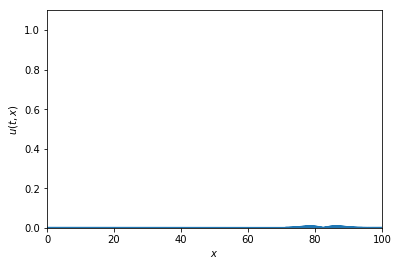

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
%matplotlib inline

# Definition of the initial Gaussian profile
def Psi(x):
    x0 = 30. 
    sigma = np.sqrt(15.)
    return np.exp(-(x-x0)**2/(2*sigma**2))

# Velocity of the advection
v = 0.1

# CFL Coefficient
C = 0.2

# Definition of the grids
x_i = 0.
x_f = 100.
xgrid = np.linspace(x_i, x_f, 1000)
dx = xgrid[1] - xgrid[0]

t_i = 0.
t_f = 900.
dt = C*dx/v
tgrid = np.arange(t_i, t_f, dt)

print('dx =', dx)
print('C_{CFL} =', C)
print('dt =', dt)

# Leap Frog Method
def LF(u0, u1):
    unew = np.zeros(len(xgrid))
    # Left boundary condition
    unew[0] = u0[0] - ((v*dt)/(dx))*(u1[1] - u1[0])
    # Right boundary condition
    unew[-1] = u0[-1] - ((v*dt)/(dx))*(u1[-1] - u1[-2])
    
    for j in range(1,len(xgrid)-1):
        unew[j] = u0[j] - ((v*dt)/(dx))*(u1[j+1] - u1[j-1])
    return unew

u_data = np.zeros([len(tgrid), len(xgrid)])
u_data[0,:] = Psi(xgrid)
u_data[1,:] = Psi(xgrid)


for i in range(2,len(tgrid)):
    u_data[i,:] = LF(u_data[i-2,:],u_data[i-1,:])


# Set up the figure, the axis, and the plot element we want to animate
fig, ax = plt.subplots()

ax.set_xlim(( 0, 100))
ax.set_ylim((0, 1.1))
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$u(t,x)$')

line, = ax.plot([], [], lw=2)

# Define the initialization function, which plots the background of each frame
def init():
    line.set_data([], [])
    return (line,)

def animate(i):
    x = xgrid
    step = int(len(tgrid)/200)
    y = u_data[step*i,:] # We take only some of the frames (given by 50*i)
    line.set_data(x, y)
    return (line,)

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=200, interval=20,  # only 200 frames with a duration of 20 each
                               blit=True)

HTML(anim.to_jshtml())

---
### 5. Lax-Wendroff Method

The **Lax-Wendroff** method is an extension of the Lax-Friedrich method
to second order in space and time. It is given by

\begin{equation}
u_j^{(n+1)} = u_j^n - \frac{v\Delta t}{2\Delta x} \left(u_{j+1}^{(n)}
- u_{j-1}^{(n)} \right) + \frac{v^2(\Delta t)^2}{2(\Delta x)^2} \left(
u_{j-1}^{(n)} - 2 u_j^{(n)} + u_{j+1}^{(n)}\right)\,\,.
\end{equation}

It has considerably better accuracy than the Lax-Friedrich method and is
stable for $\alpha \le 1$

dx = 0.1001001001001001
C_{CFL} = 0.2
dt = 0.2002002002002002


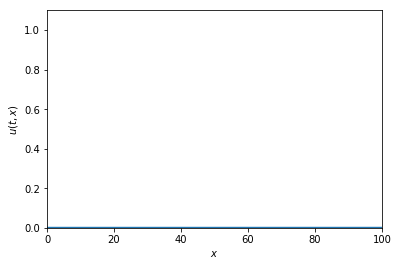

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
%matplotlib inline

# Definition of the initial Gaussian profile
def Psi(x):
    x0 = 30. 
    sigma = np.sqrt(15.)
    return np.exp(-(x-x0)**2/(2*sigma**2))

# Velocity of the advection
v = 0.1

# CFL Coefficient
C = 0.2

# Definition of the grids
x_i = 0.
x_f = 100.
xgrid = np.linspace(x_i, x_f, 1000)
dx = xgrid[1] - xgrid[0]

t_i = 0.
t_f = 900.
dt = C*dx/v
tgrid = np.arange(t_i, t_f, dt)

print('dx =', dx)
print('C_{CFL} =', C)
print('dt =', dt)

# Lax-Wendroff Method
def LW(u):
    unew = np.zeros(len(xgrid))
    # Left boundary condition
    unew[0] = u[0] - ((v*dt)/(2*dx))*(u[1] - u[0])\
             + ((v**2 *dt**2)/(2*dx**2))*(u[0] - 2*u[0] + u[1])
    # Right boundary condition
    unew[-1] = u[-1] - ((v*dt)/(2*dx))*(u[-1] - u[-2])\
                  + ((v**2 *dt**2)/(2*dx**2))*(u[-2] - 2*u[-1] + u[-1])
    
    for j in range(1,len(xgrid)-1):
        unew[j] = u[j] - ((v*dt)/(2*dx))*(u[j+1] - u[j-1])\
                  + ((v**2 *dt**2)/(2*dx**2))*(u[j-1] - 2*u[j] + u[j+1])
    return unew

u_data = np.zeros([len(tgrid), len(xgrid)])
u_data[0,:] = Psi(xgrid)


for i in range(1,len(tgrid)):
    u_data[i,:] = LW(u_data[i-1,:])


# Set up the figure, the axis, and the plot element we want to animate
fig, ax = plt.subplots()

ax.set_xlim(( 0, 100))
ax.set_ylim((0, 1.1))
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$u(t,x)$')

line, = ax.plot([], [], lw=2)

# Define the initialization function, which plots the background of each frame
def init():
    line.set_data([], [])
    return (line,)

def animate(i):
    x = xgrid
    step = int(len(tgrid)/200)
    y = u_data[step*i,:] # We take only some of the frames (given by 50*i)
    line.set_data(x, y)
    return (line,)

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=200, interval=20,  # only 200 frames with a duration of 20 each
                               blit=True)

HTML(anim.to_jshtml())

dx = 0.1001001001001001
C_{CFL} = 0.2
dt = 0.2002002002002002


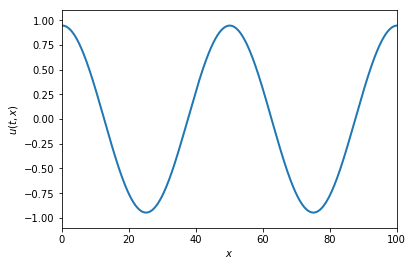

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
%matplotlib inline

# Definition of the initial Sin profile
def Psi(x):
    return np.sin(4*np.pi*x/x_f)

# Velocity of the advection
v = 0.1

# CFL Coefficient
C = 0.2

# Definition of the grids
x_i = 0.
x_f = 100.
xgrid = np.linspace(x_i, x_f, 1000)
dx = xgrid[1] - xgrid[0]

t_i = 0.
t_f = 900.
dt = C*dx/v
tgrid = np.arange(t_i, t_f, dt)

print('dx =', dx)
print('C_{CFL} =', C)
print('dt =', dt)

# Lax-Wendroff Method
def LW(u):
    unew = np.zeros(len(xgrid))
    
    # Periodic boundary conditions 
    unew[0] = u[len(unew)-1]
    
    for j in range(1,len(xgrid)):
        unew[j] = u[j] - ((v*dt)/(dx))*(u[j] - u[j-1])
    return unew

u_data = np.zeros([len(tgrid), len(xgrid)])
u_data[0,:] = upwind(Psi(xgrid))


for i in range(1,len(tgrid)):
    u_data[i,:] = upwind(u_data[i-1,:])


# Set up the figure, the axis, and the plot element we want to animate
fig, ax = plt.subplots()

ax.set_xlim(( 0, 100))
ax.set_ylim((-1.1, 1.1))
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$u(t,x)$')

line, = ax.plot([], [], lw=2)

# Define the initialization function, which plots the background of each frame
def init():
    line.set_data([], [])
    return (line,)

def animate(i):
    x = xgrid
    step = int(len(tgrid)/200)
    y = u_data[step*i,:] # We take only some of the frames (given by 50*i)
    line.set_data(x, y)
    return (line,)

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=200, interval=20,  # only 200 frames with a duration of 20 each
                               blit=True)

HTML(anim.to_jshtml())
